<a href="https://colab.research.google.com/github/drjaehongmin/2021-summer-main/blob/master/W251_Group_Project_Code.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Initialization

In [1]:
# Loads YoloV5. It is based on yolov5 Github
# Ref: https://github.com/ultralytics/yolov5

!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5 # 
%pip install -qr requirements.txt  # install dependencies, the -qr is -quiet and -requirements
%pip install -q wandb # Install wand b
!pip install pyyaml # Installs pyyaml

Cloning into 'yolov5'...
remote: Enumerating objects: 10111, done.
remote: Counting objects: 100% (64/64), done.
remote: Compressing objects: 100% (27/27), done.
remote: Total 10111 (delta 40), reused 45 (delta 37), pack-reused 10047
Receiving objects: 100% (10111/10111), 10.28 MiB | 17.83 MiB/s, done.
Resolving deltas: 100% (7008/7008), done.
[Errno 2] No such file or directory: 'yolov5 #'
/content
ERROR: Could not open requirements file: [Errno 2] No such file or directory: 'requirements.txt'


In [48]:
# Import libraries required for the program
import torch # For use of YoloV5
import cv2 # For Image Processing
import matplotlib.pyplot as plt # For visualization
import os # For manipuation of file locations
from shutil import copyfile # To copy files from different locations
from IPython.display import Image, clear_output  # to display images
from google.colab import drive # To mount a Google Drive
import yaml # For reading and editing YAML files
import numpy as np # Numpy functions required
from skimage.util import random_noise # adding noise
from google.colab.patches import cv2_imshow # This is to allow images to show via cv2's imshow given isseus with Jupyter Notebook in Colab crashing with cv2.imshow
import wandb # For visualization of weights

In [3]:
# Check if GPU used for training data usage
print('Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Using torch 1.9.0+cu111 _CudaDeviceProperties(name='Tesla P100-PCIE-16GB', major=6, minor=0, total_memory=16280MB, multi_processor_count=56)


In [4]:
# Load datasets
# Mount Google Drive
drive.mount('/content/drive') # mount the drive

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Training of YOLOv5

### Training on manipulated image dataset

#### Download datasets

In [87]:
# Downloads the the datasets to be used in the training and unzips
os.chdir('/content/') # Go to the directory of contents
#!wget "https://github.com/ultralytics/yolov5/releases/download/v1.0/coco128.zip" # Downloads the dataset
!unzip -q coco128.zip -d datasets/ # Extracts the dataset

replace datasets/coco128/.DS_Store? [y]es, [n]o, [A]ll, [N]one, [r]ename: A


#### Manipulate dataset

In [88]:
# Manipulates data in dataset
os.chdir('/content/datasets/coco128/images/train2017/') # Change directory to directory with images
file_list = os.listdir() # Get list of images in the directory

WIDTH_OF_BANDS = 6 # Determines the width of the "bands" that are formed
RATE_OF_DISTORTION = 3 # Determines how much horizontal shear happens in the images

# runs a for loop over all the files 
for file_name in file_list:
  if file_name.endswith(".jpg"): # Checks that it is an jpg file
    # Enter the functions to alter the images

    # 1. Function to change to Gray-scale
    original = cv2.imread(file_name)
    original_name = file_name
    img1 = cv2.imread(file_name, 0)
    

    # 2. Function to add some blurring (Using speckle" noise)
    # Reasoning for "speckle" is that it adds grain to the image instead of smoothing it out
    # Ref https://scikit-image.org/docs/dev/api/skimage.util.html#skimage.util.random_noise
    img2 = random_noise(img1, mode='speckle')
    img2 = np.array(255*img2, dtype = 'uint8')

    # 3. Adds vertical shifting:
    img3 = img2
    x_shift1 = 1
    x_shift2 = 1

    for i in range(img2.shape[0]):

      img3[i,:] = np.roll(img2[i,:], x_shift1)

      x_shift2 = x_shift2 + 1
      
      if x_shift1 >= WIDTH_OF_BANDS:
        x_shift1 = 1
      if x_shift2 >= RATE_OF_DISTORTION:
        x_shift2 = 1
        x_shift1 = x_shift1 + 1
      
    # Outputs the image file
    cv2.imwrite(file_name, img3)

Original Image


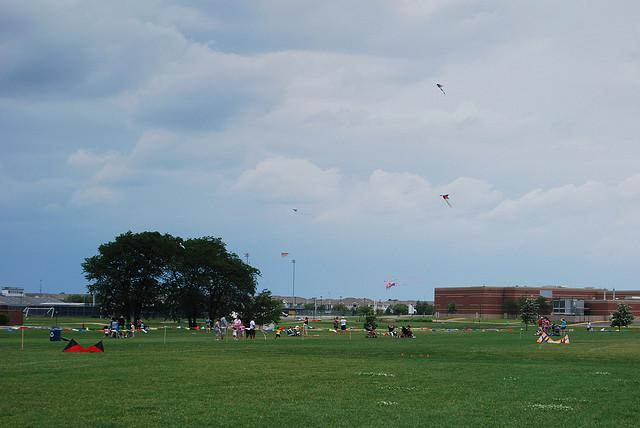

In [91]:
# Example of original image
print("Original Image")
cv2_imshow(original)

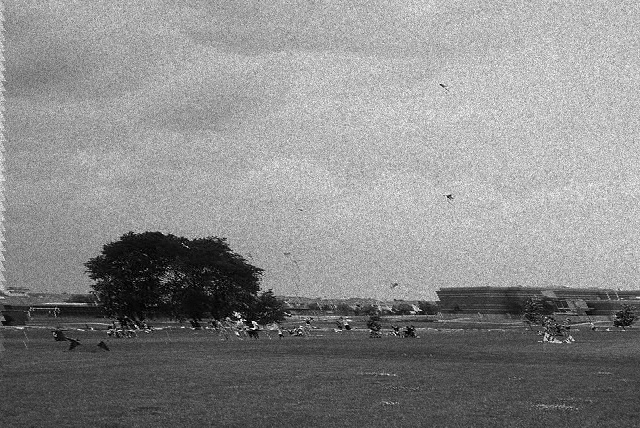

In [90]:
# Exmaple of changed image
print("jP Image")
Image(original_name)

#### Train datasets

In [92]:
# Train YOLOv5s on the new image set
os.chdir('/content/yolov5/') # Change directory to where Yolo v5 python file lives

# Define the following variables:
# batch = number of batches to be trained
# epochs = Number of epochs to be trained
# data = Using the YAML file to load the location and the labels of the dataset
# weights = This is the model wieghts to be used
!python train.py --img 640 --batch 16 --epochs 3 --data coco128.yaml --weights yolov5s.pt --cache

train: weights=yolov5s.pt, cfg=, data=coco128.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=3, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=0, save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.0-74-gb8f979b torch 1.9.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees=0.0, translate=0.1, scale=0

In [93]:
# Shows the tensorboard of the different datasets
%load_ext tensorboard
%tensorboard --logdir runs/train

<IPython.core.display.Javascript object>

In [97]:
# Weights & Biases
wandb.login()

wandb: Currently logged in as: jaehongmin (use `wandb login --relogin` to force relogin)


True

### Testing on LIDAR Image sets

In [114]:
# Run on original Image Yolov5
# Test against Yolov5
!cp /content/drive/MyDrive/Academic/W251\ Final\ Project/Dataset/test_set/test_image1.jpg /content/yolov5/data/images/
os.chdir("/content/yolov5")
!python detect.py --weights yolov5s.pt --img 640 --conf 0.25 --source data/images/test_image1.jpg

detect: weights=['yolov5s.pt'], source=data/images/test_image1.jpg, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-74-gb8f979b torch 1.9.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model Summary: 213 layers, 7225885 parameters, 0 gradients
image 1/1 /content/yolov5/data/images/test_image1.jpg: 96x640 1 person, 1 bird, Done. (0.010s)
Speed: 0.4ms pre-process, 9.8ms inference, 1.7ms NMS per image at shape (1, 3, 640, 640)
Results saved to runs/detect/exp7


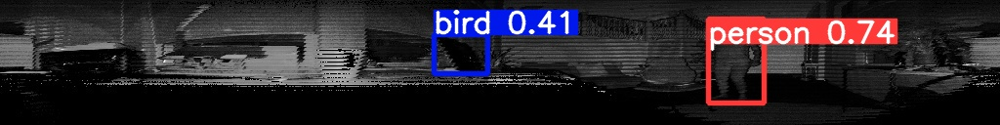

In [115]:
# Test against Yolov5
#!python detect.py --weights yolov5s.pt --img 640 --conf 0.25 --source data/images/bus_gs.jpg
Image(filename='runs/detect/exp7/test_image1.jpg', width=600)